### Note
This notebook analyses experiments in which recurrent connections in the eA1 are grown.

In [1]:
import pandas as pd
from matplotlib import pyplot as plt
import numpy as np
from fna.tools.signals import make_simple_kernel, pad_array

import os
import sys
import re
import sys

import pickle

** mayavi.mlab ** package is not installed. To have functions using mayavi.mlab please install the package.
** pyspike ** package is not installed. To have functions using pyspike please install the package.
** pyspike ** package is not installed. To have functions using pyspike please install the package.


In [2]:
sys.path.append("../../demyelination/") # we need this to successfully read pickle files
sys.path.append("../../") # we need this to successfully read pickle files

In [3]:
def gatherSpikes(path, filename, nthreads, brainPart, neuronIdFirst, neuronIdLast):
    '''
    Example Usage: 
    gatherSpikes("demyelination/data/adaptation-aone-plast/activity/", \
                 "spk_adaptation-aone-plast_T=0_nuX_aone=20.0_gamma_aone=9.0_w_input_aone=15.0_", \
                 2, "iA1", 2001, 2500)
    '''
    
    spikes = {}
    files = {}
    
    # read files
    for threadid in range(nthreads):
        files[threadid] = pd.read_pickle(path + filename + str(threadid))
    
    for neuron in range(neuronIdFirst, neuronIdLast+1):
        rthread = neuron % nthreads
        files[0].spikeobj[brainPart].spiketrains[neuron] = files[rthread].spikeobj[brainPart].spiketrains[neuron]
    
    return files[0].spikeobj[brainPart]

# def gatherConnectivity(path, filename, nthreads, brainPart, DenType):
#     files = {}
#     # read files
#     for threadid in range(nthreads):
#         files[threadid] = pd.read_pickle(path + filename + str(threadid))

#     conn = np.sum([files[x].connectivity['z_connected']['Den'][DenType][brainPart] for x in range(nthreads)], axis=0)
    
#     return conn

def gatherConnectivity(path, filename, nthreads):
    files = {}
    # read files
    for threadid in range(nthreads):
        files[threadid] = pd.read_pickle(path + filename + str(threadid))

    for var in ["z", "z_connected"]:
        for synElem in ["Axon", "Den"]:
            for synElemType in ["ex", "in"]:
                for brainPart in ["eA1", "iA1"]:
                    files[0].connectivity[var][synElem][synElemType][brainPart] = \
                    np.sum([files[x].connectivity[var][synElem][synElemType][brainPart] for x in range(nthreads)], axis=0)
    
    return files[0].connectivity

def gatherNestConnectivity(path, filename, nthreads, source, target):
    files = {}
    # read files
    for threadid in range(nthreads):
        files[threadid] = pd.read_pickle(path + filename + str(threadid))

    conn = np.sum([files[x].nestconnectivity[source][target] for x in range(nthreads)], axis=0)
    
    return conn

def gatherCalcium (path, filename, nthreads):
    files = {}
    # read files
    for threadid in range(nthreads):
        files[threadid] = pd.read_pickle(path + filename + str(threadid))

    calc = {}
    for source in ['eA1', 'MGN']:
        calc.update( {source : np.mean([files[x].calcium[source] for x in range(nthreads)], axis=0)} )
    
    return calc

In [4]:
def readnet_timeinterval(exp_name, time_interval, stop_time, nthreads=8, parameter_file=None):
    dfs = []
    record_times = [0] + list( range(time_interval, stop_time, time_interval) )

    for t in record_times:
        if parameter_file == None:
            dump_filename = '../../demyelination/data/' + exp_name + '/other/' + str(t) + '.0_net_'
        else:
            dump_filename = '../../demyelination/data/' + exp_name + '/other/' + parameter_file + '/' + str(t) + '.0_net_'

        df = pd.DataFrame()

        for threadid in range(nthreads):
            with open(dump_filename + str(threadid), "rb") as f:
                network = pickle.load(f)

                net = network['synapse_ex']
                #print(net.shape)

                df = pd.concat([df, net])
        dfs.append(df)
    return dfs

In [5]:
import networkx as nx
from networkx.algorithms import bipartite

In [6]:
def plotConnectionGraph (conn_df, ax):
    g = nx.Graph()

    max_height_plot = len( conn_df.target.unique() ) # the graph must be the height of eaone neurons
    mgn_node_space = max_height_plot / len( conn_df.source.unique() ) 

    pos = {}
    pos.update( (n, (1, idx*mgn_node_space)) for idx, n in enumerate(conn_df.source.unique()) )

    pos.update( (n, (2, idx)) for idx, n in enumerate(conn_df.target.unique()) )

    mgn_nodes = conn_df.source.unique()
    g.add_nodes_from(mgn_nodes)

    eaone_nodes = conn_df.target.unique()
    g.add_nodes_from(eaone_nodes)
    
    # adding edges with weight 4
    wfour = conn_df[conn_df.weight == 4]
    for src, tgt in zip (wfour.source, wfour.target):
        # if the connection was predefined and not grown
        if (
            (src in range(1, 41) and tgt in range(401, 801)) |
            (src in range(41, 81) and tgt in range(801, 1201)) |
            (src in range(81, 121) and tgt in range(1201, 1601)) |
            (src in range(121, 161) and tgt in range(1601, 2001)) |
            (src in range(161, 201) and tgt in range(2001, 2401))
        ):
            g.add_edge(src, tgt, color='r')
        else:
            g.add_edge(src, tgt, color='b')
    
    # adding edges with weight 0
    wzero = conn_df[conn_df.weight == 0]
    for src, tgt in zip (wzero.source, wzero.target):
        g.add_edge(src, tgt, color='k')
    
    colors = nx.get_edge_attributes(g,'color').values()
    
    nx.draw_networkx(g, pos = pos, ax=ax, node_size=10, with_labels=False, linewidths=.001, alpha=.01, edge_color=colors)

** mnist.loader ** package is not installed. To have functions using mnist.loader please install the package.
** tables ** package is not installed. To have functions using tables please install the package.
Mean Firing Rates (TRN, MGN, eA1, iA1)
7.575555555555556
11.748888888888887
10.269111111111112
18.538666666666668


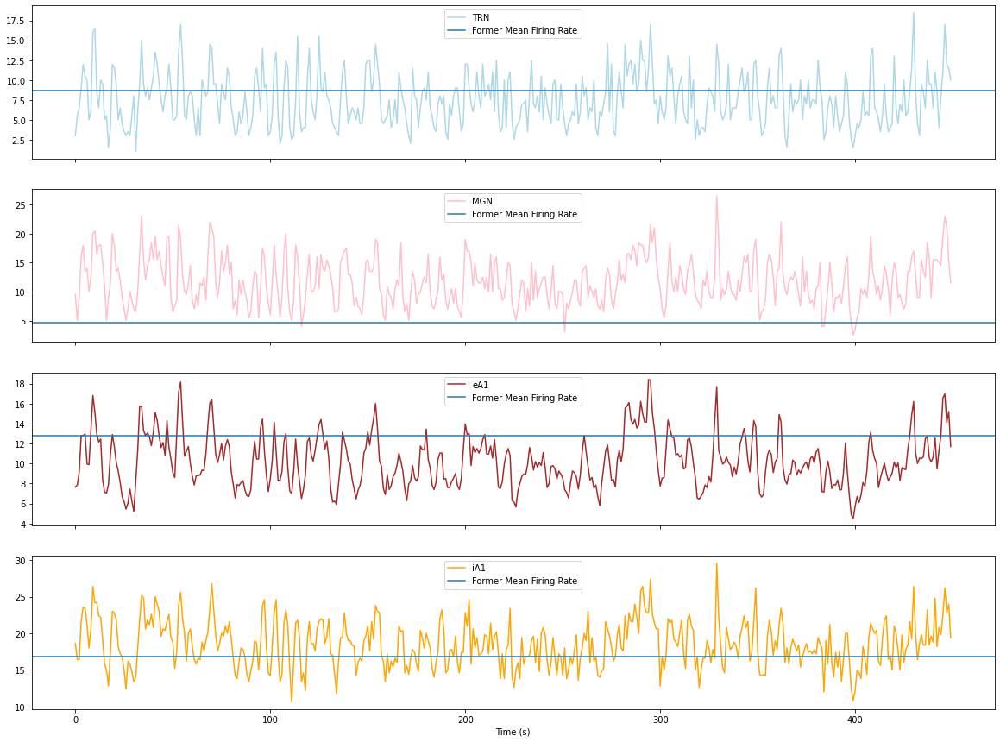

In [8]:
exp_name = 'benchmark'
pth = "../../demyelination/data/"+exp_name+"/activity/"
fl = "spk_"+exp_name+"_T=0_disabled_conn_ratio=0.0_"

nthread = 1

ex_eA1 = gatherNestConnectivity(pth, \
             fl, \
             nthread, "MGN", "eA1")


# DendriteType_Population
perc_mgn_eA1 = np.divide(ex_eA1, 2000*200)

## Data Gathering End
## Plotting Start

fig, ax = plt.subplots(nrows=4, ncols=1, sharex=True)
fig.set_size_inches(20, 15)

tstart = 500
tstop = 5 * 1000
    
resolution = 10

x = gatherSpikes(pth, fl, nthread, "TRN", 201, 400).time_slice(tstart, tstop).firing_rate(resolution, average=True)
ax[0].plot(x, label='TRN', c='lightblue')
ax[0].axhline(8.7, label="Former Mean Firing Rate")

# x, y = pipeline.smoothedspikes(p.spikeobj['MGN'].id_slice(np.arange(41, 201)).time_slice(tstart, tstop))
x = gatherSpikes(pth, fl, nthread, "MGN", 1, 200).time_slice(tstart, tstop).firing_rate(resolution, average=True)
ax[1].plot(x, label='MGN', c='pink')
ax[1].axhline(4.7, label="Former Mean Firing Rate")

# x, y = pipeline.smoothedspikes(p.spikeobj['eA1'].id_slice(np.arange(801, 2400)).time_slice(tstart, tstop))
x = gatherSpikes(pth, fl, nthread, "eA1", 401, 2400).time_slice(tstart, tstop).firing_rate(resolution, average=True)
ax[2].plot(x, label='eA1', c='brown')
ax[2].axhline(12.8, label="Former Mean Firing Rate")

# x, y = pipeline.smoothedspikes(p.spikeobj['iA1'].time_slice(tstart, tstop))
x = gatherSpikes(pth, fl, nthread, "iA1", 2401, 2900).time_slice(tstart, tstop).firing_rate(resolution, average=True)
ax[3].plot(x, label='iA1', c='orange')
ax[3].axhline(16.8, label="Former Mean Firing Rate")

'''
x_range = np.arange(0, 601, 20)

ax[4].plot(x_range, perc_mgn_eA1, ":", label="eA1->eA1")
ax[4].set_ylabel("Epsilon")

ax[5].plot(x_range, gatherCalcium(pth, fl, nthread)['eA1'], label="eA1")
ax[5].plot(x_range, gatherCalcium(pth, fl, nthread)['MGN'], label="MGN")
ax[5].axhline(.13, ls=":", label="eA1 Target")
ax[5].axhline(.047, ls=":", label="MGN Target", color="orange")
ax[5].set_ylabel("Calcium Level")

# ax[6].plot(x_range, connectivity['z']['Axon']['in']['iA1'], label="eA1")
'''

print("Mean Firing Rates (TRN, MGN, eA1, iA1)")
print(gatherSpikes(pth, fl, nthread, "TRN", 201, 400).time_slice(tstart, tstop).mean_rate())
print(gatherSpikes(pth, fl, nthread, "MGN", 1, 200).time_slice(tstart, tstop).mean_rate())
print(gatherSpikes(pth, fl, nthread, "eA1", 401, 2400).time_slice(tstart, tstop).mean_rate())
print(gatherSpikes(pth, fl, nthread, "iA1", 2401, 2900).time_slice(tstart, tstop).mean_rate())


plt.xlabel("Time (s)")
# plt.ylabel("Mean Spiking Rate")

# plt.xticks(range(0, 20, 1), range(0, 1000, 50))

[ax[_].legend() for _ in range(4)];

# plt.xlim(0, 10)
# ax[4].set_ylim(0.014, .016)

# plt.savefig("/home/pbr-student/Downloads/thesis-plots/destexhe-sp-overshoot-calcium-slowrate-highupdate.pdf")

## mgn-to-eaone-50pc-highgr

In [903]:
perc_mgn_eA1

array([0.015765 , 0.015765 , 0.015765 , 0.02459  , 0.0252775, 0.02608  ,
       0.0267325, 0.027145 , 0.02766  , 0.0279475, 0.02835  , 0.0285275,
       0.0288725, 0.0291125, 0.0292225, 0.029385 , 0.02964  , 0.029875 ,
       0.0301375, 0.03025  , 0.0305325, 0.0306575, 0.0308   ])

In [854]:
gatherSpikes(pth, fl, nthread, "MGN", 1, 200).time_slice(50000, 55000).firing_rate(1000, average=True)

array([14.705, 16.64 , 17.205, 16.75 , 16.895], dtype=float32)

In [859]:
gatherCalcium(pth, fl, nthread)

{'eA1': array([0.        , 0.06521466, 0.08926432, 0.09732012, 0.10054187,
        0.10054187, 0.13137731, 0.14476779, 0.14845762, 0.15515913,
        0.16039073, 0.15351308, 0.1489267 , 0.1479951 , 0.14369245,
        0.13873215]),
 'MGN': array([0.        , 0.07245038, 0.10020286, 0.1093379 , 0.11337546,
        0.11337546, 0.14572004, 0.15867438, 0.16364959, 0.17028716,
        0.17614639, 0.16942317, 0.16421536, 0.16413685, 0.15950174,
        0.15358939])}

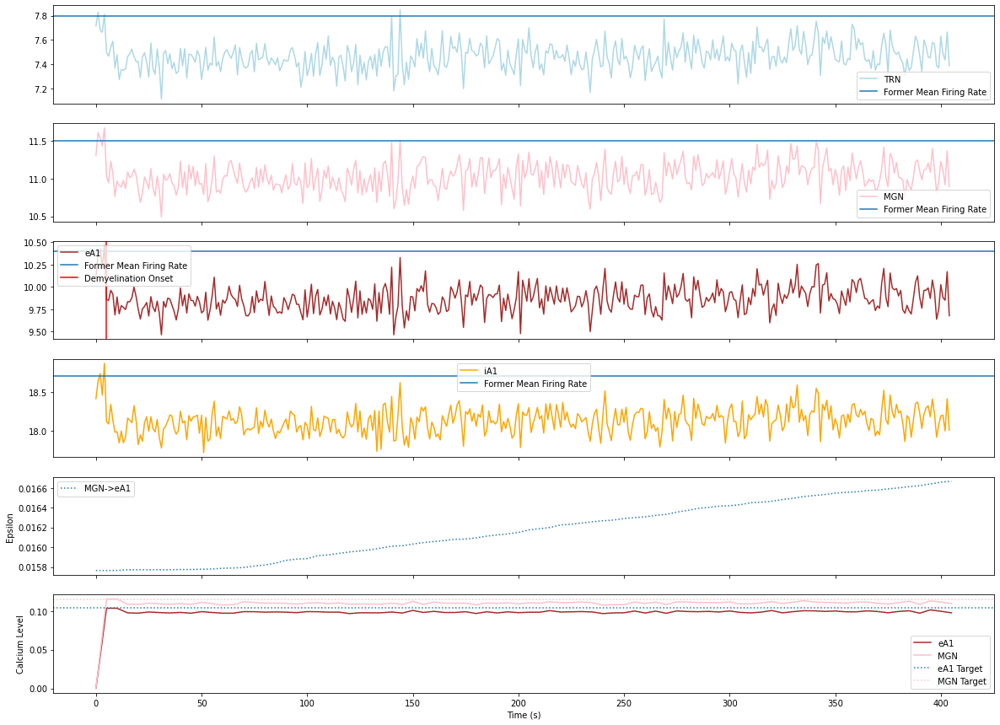

In [88]:
exp_name = 'mgn-to-eaone-longsim'
pth = "../../demyelination/data/"+exp_name+"/activity/"
fls = ["spk_mgn-to-eaone-longsim_disabled_conn_ratio=0.2_gr_scale=1e-05_update_interval=50_0"]

nthread = 1

for _ in [0]:
    for fl in fls:
        fl = fl[:-1] # need to get rid of the thread if for backward compatibility
        ex_eA1 = gatherNestConnectivity(pth, \
                     fl, \
                     nthread, "MGN", "eA1")

        # DendriteType_Population
        perc_mgn_eA1 = np.divide(ex_eA1, 2000*200)

        ## Data Gathering End
        ## Plotting Start

        fig, ax = plt.subplots(nrows=6, ncols=1, sharex=True)
        fig.set_size_inches(20, 15)

        tstart = 0 * 1000
        tstop = 10050 * 1000

        resolution = 10 * 1000

        x = gatherSpikes(pth, fl, nthread, "TRN", 201, 400).time_slice(tstart, tstop).firing_rate(resolution, average=True)
        ax[0].plot(x, label='TRN', c='lightblue')
        ax[0].axhline(7.8, label="Former Mean Firing Rate")

        # x, y = pipeline.smoothedspikes(p.spikeobj['MGN'].id_slice(np.arange(41, 201)).time_slice(tstart, tstop))
        x = gatherSpikes(pth, fl, nthread, "MGN", 1, 200).time_slice(tstart, tstop).firing_rate(resolution, average=True)
        ax[1].plot(x, label='MGN', c='pink')
        ax[1].axhline(11.5, label="Former Mean Firing Rate")

        # x, y = pipeline.smoothedspikes(p.spikeobj['eA1'].id_slice(np.arange(801, 2400)).time_slice(tstart, tstop))
        x = gatherSpikes(pth, fl, nthread, "eA1", 401, 2400).time_slice(tstart, tstop).firing_rate(resolution, average=True)
        ax[2].plot(x, label='eA1', c='brown')
        ax[2].axhline(10.4, label="Former Mean Firing Rate")

        # x, y = pipeline.smoothedspikes(p.spikeobj['iA1'].time_slice(tstart, tstop))
        x = gatherSpikes(pth, fl, nthread, "iA1", 2401, 2900).time_slice(tstart, tstop).firing_rate(resolution, average=True)
        ax[3].plot(x, label='iA1', c='orange')
        ax[3].axhline(18.7, label="Former Mean Firing Rate")

        x_range = np.arange(0, 406, 5)

        ax[4].plot(x_range, perc_mgn_eA1[1:], ":", label="MGN->eA1")
        ax[4].set_ylabel("Epsilon")

        ax[5].plot(x_range, gatherCalcium(pth, fl, nthread)['eA1'][:-1], label="eA1", color="brown")
        ax[5].plot(x_range, gatherCalcium(pth, fl, nthread)['MGN'][:-1], label="MGN", color="pink")
        ax[5].axhline(.104, ls=":", label="eA1 Target")
        ax[5].axhline(.115, ls=":", label="MGN Target", color="pink")
        ax[5].set_ylabel("Calcium Level")

        # ax[6].plot(x_range, connectivity['z']['Axon']['in']['iA1'], label="eA1")

        plt.xlabel("Time (s)")
        # plt.ylabel("Mean Spiking Rate")

        # plt.xticks(range(0, 20, 1), range(0, 1000, 50))

        ax[2].axvline(5, label="Demyelination Onset", color="red")
        [ax[_].legend() for _ in range(6)];

#         plt.xlim(0, 100)
#         ax[4].set_ylim(0.014, .016)

#         plt.savefig("/home/pbr-student/Downloads/thesis-plots/mgn_to_eaone/"+fl+".pdf")

spk_mgn-to-eaone_disabled_conn_ratio=0_gr_scale=1e-05_update_interval=50_
spk_mgn-to-eaone_disabled_conn_ratio=0.5_gr_scale=1e-05_update_interval=50_
spk_mgn-to-eaone_disabled_conn_ratio=0.2_gr_scale=1e-05_update_interval=50_


<ipython-input-18-c8184b688839>:22: RuntimeWarning:More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


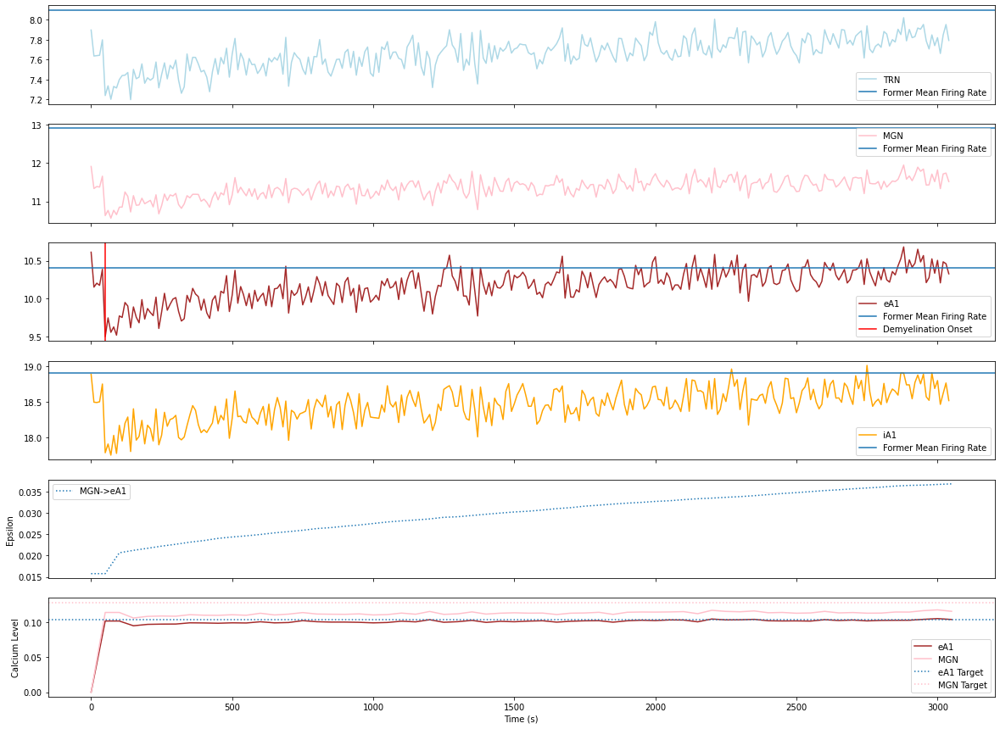

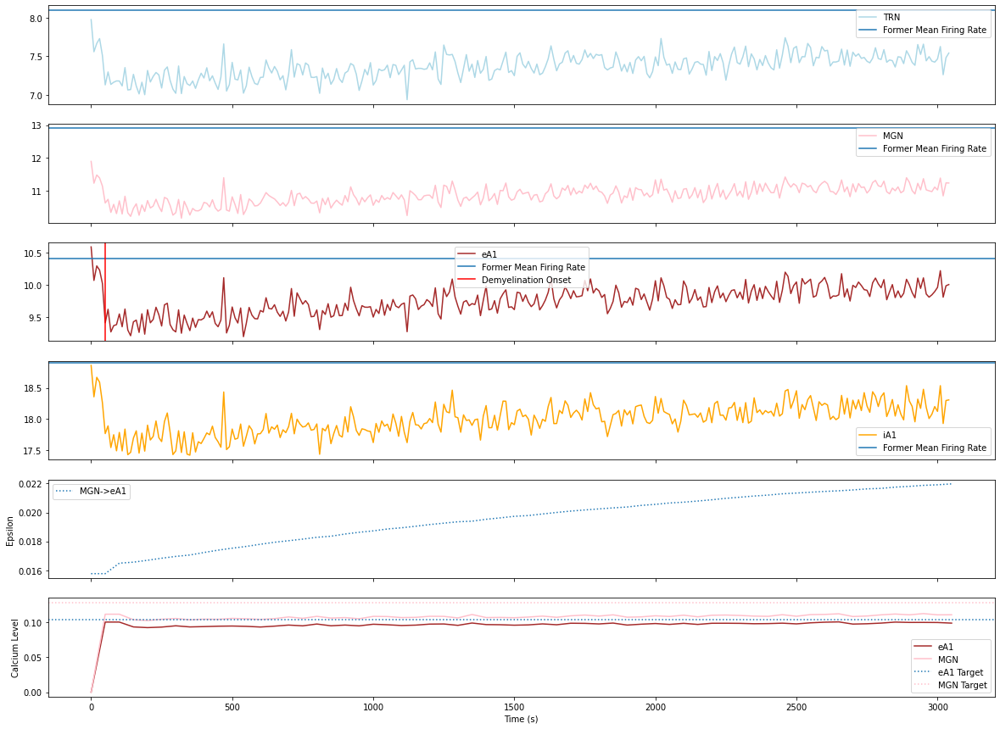

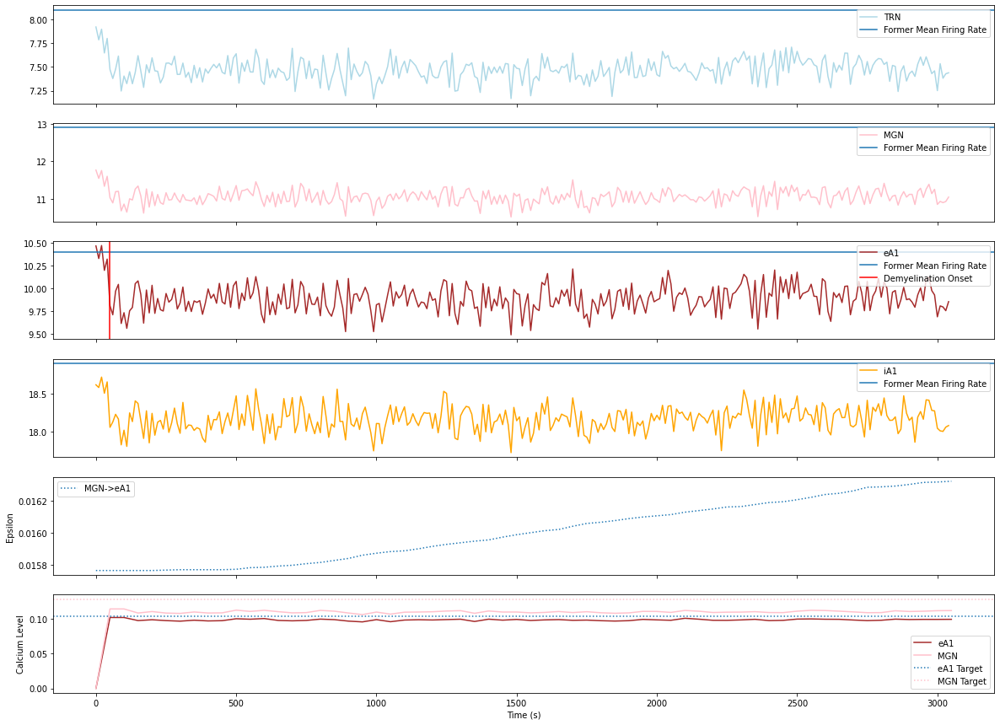

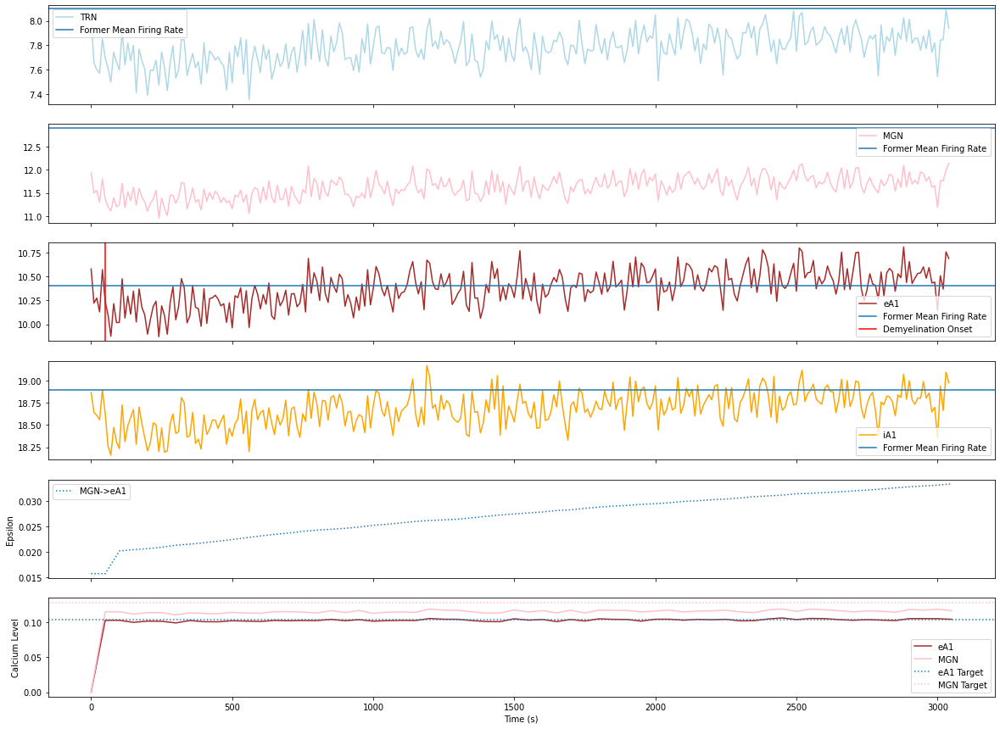

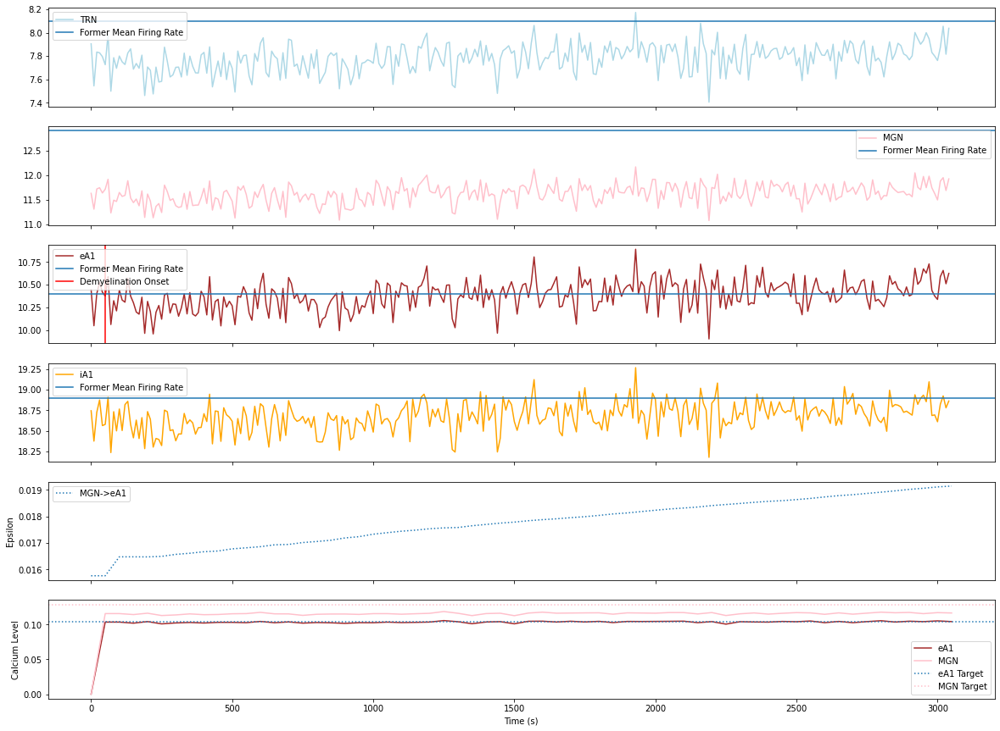

...

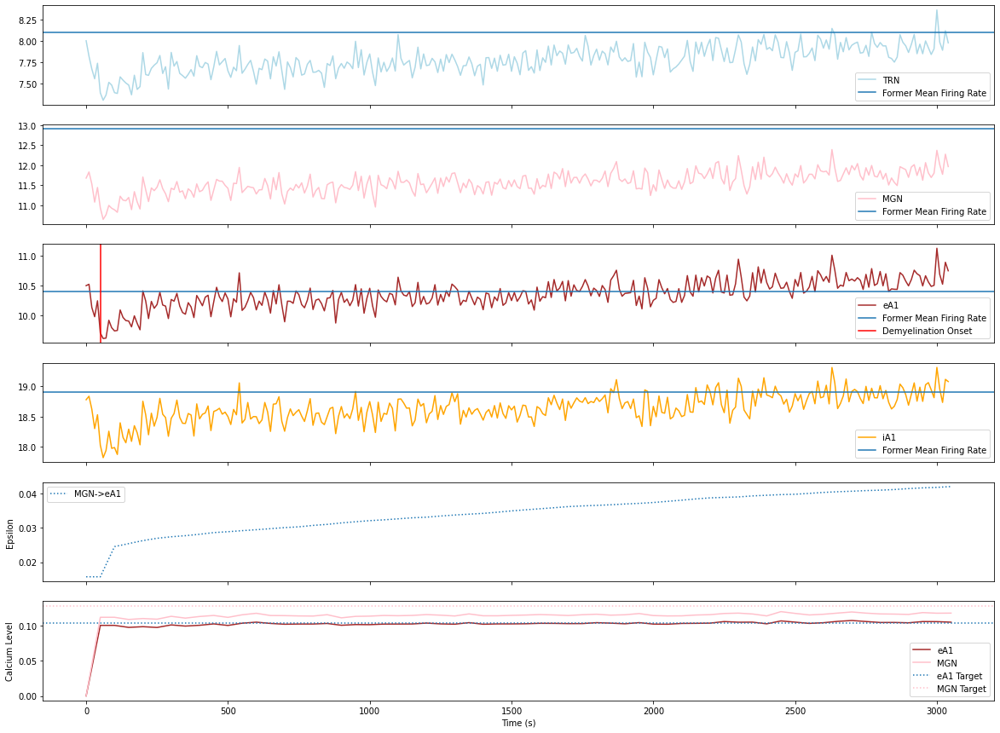

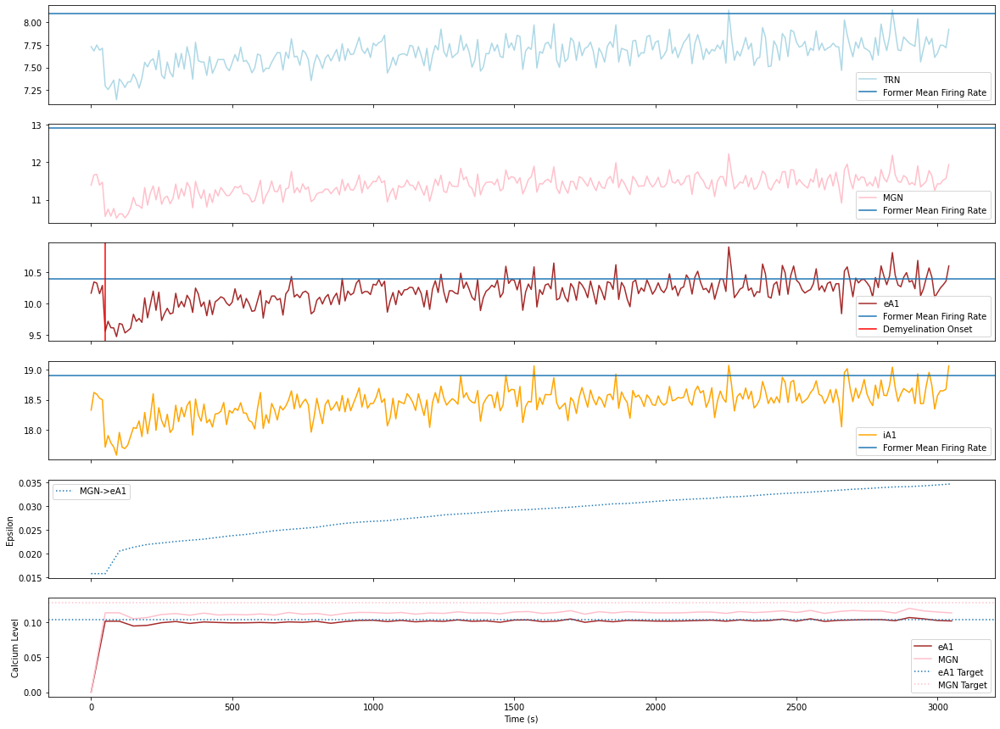

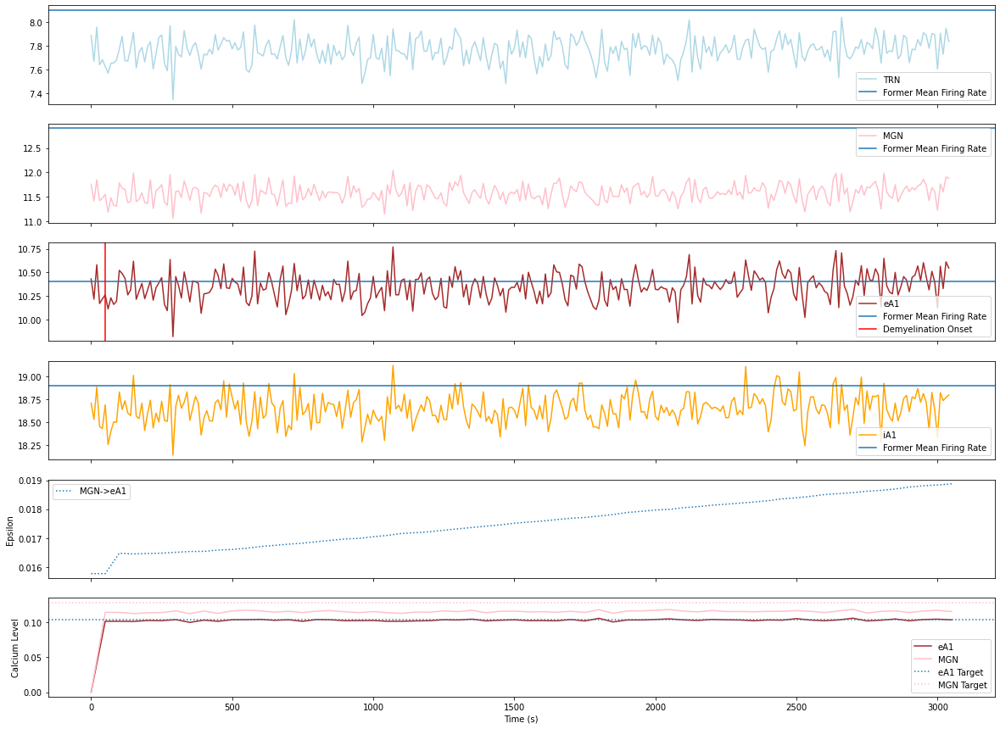

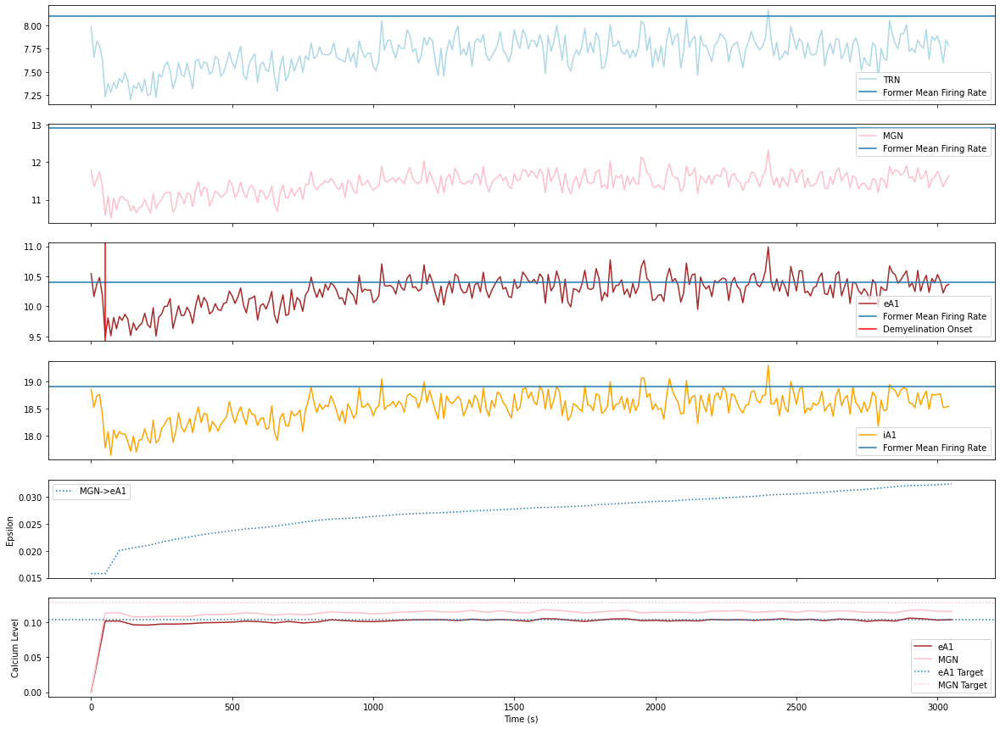

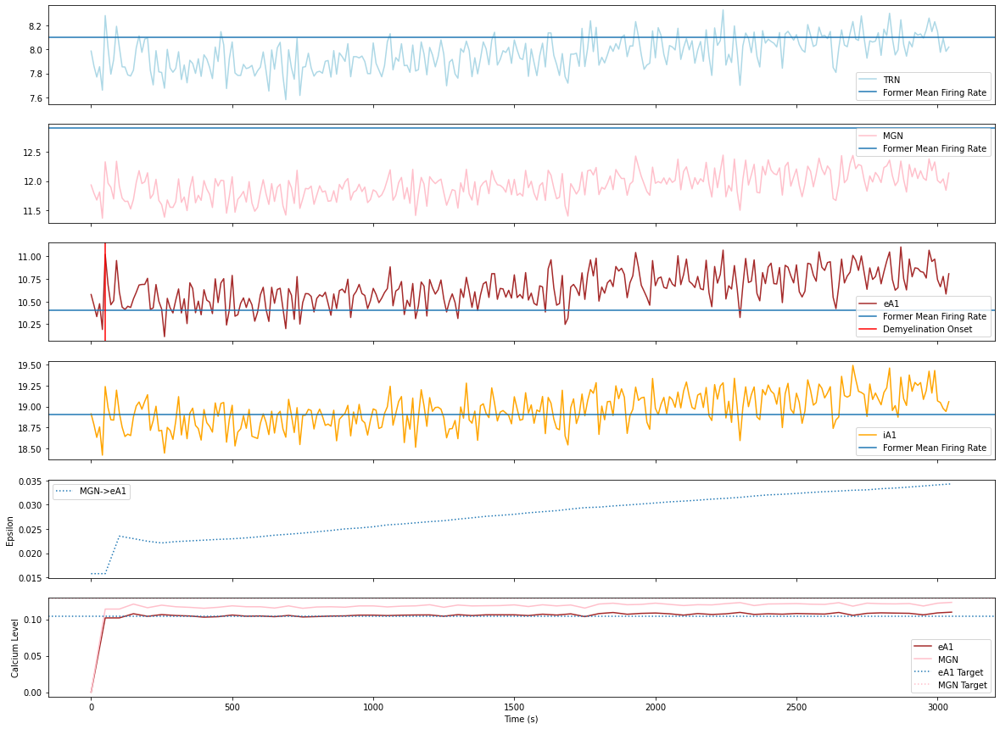

In [18]:
exp_name = 'mgn-to-eaone'
pth = "../../demyelination/data/"+exp_name+"/activity/"
# fl = "spk_"+exp_name+"_T=0_disabled_conn_ratio=0_gr_scale=0.001_update_interval=50_"

nthread = 1

for _, _, fls in os.walk(pth):
    for fl in fls:
        try:
            fl = fl[:-1] # need to get rid of the thread if for backward compatibility

            ex_eA1 = gatherNestConnectivity(pth, \
                         fl, \
                         nthread, "MGN", "eA1")

            # DendriteType_Population
            perc_mgn_eA1 = np.divide(ex_eA1, 2000*200)

            ## Data Gathering End
            ## Plotting Start

            fig, ax = plt.subplots(nrows=6, ncols=1, sharex=True)
            fig.set_size_inches(20, 15)

            tstart = 0 * 1000
            tstop = 3050 * 1000

            resolution = 10 * 1000

            x = gatherSpikes(pth, fl, nthread, "TRN", 201, 400).time_slice(tstart, tstop).firing_rate(resolution, average=True)
            ax[0].plot(x, label='TRN', c='lightblue')
            ax[0].axhline(8.1, label="Former Mean Firing Rate")

            # x, y = pipeline.smoothedspikes(p.spikeobj['MGN'].id_slice(np.arange(41, 201)).time_slice(tstart, tstop))
            x = gatherSpikes(pth, fl, nthread, "MGN", 1, 200).time_slice(tstart, tstop).firing_rate(resolution, average=True)
            ax[1].plot(x, label='MGN', c='pink')
            ax[1].axhline(12.9, label="Former Mean Firing Rate")

            # x, y = pipeline.smoothedspikes(p.spikeobj['eA1'].id_slice(np.arange(801, 2400)).time_slice(tstart, tstop))
            x = gatherSpikes(pth, fl, nthread, "eA1", 401, 2400).time_slice(tstart, tstop).firing_rate(resolution, average=True)
            ax[2].plot(x, label='eA1', c='brown')
            ax[2].axhline(10.4, label="Former Mean Firing Rate")

            # x, y = pipeline.smoothedspikes(p.spikeobj['iA1'].time_slice(tstart, tstop))
            x = gatherSpikes(pth, fl, nthread, "iA1", 2401, 2900).time_slice(tstart, tstop).firing_rate(resolution, average=True)
            ax[3].plot(x, label='iA1', c='orange')
            ax[3].axhline(18.9, label="Former Mean Firing Rate")

            x_range = np.arange(0, 306, 5)

            ax[4].plot(x_range, perc_mgn_eA1[1:], ":", label="MGN->eA1")
            ax[4].set_ylabel("Epsilon")

            ax[5].plot(x_range, gatherCalcium(pth, fl, nthread)['eA1'][:-1], label="eA1", color="brown")
            ax[5].plot(x_range, gatherCalcium(pth, fl, nthread)['MGN'][:-1], label="MGN", color="pink")
            ax[5].axhline(.104, ls=":", label="eA1 Target")
            ax[5].axhline(.129, ls=":", label="MGN Target", color="pink")
            ax[5].set_ylabel("Calcium Level")

            # ax[6].plot(x_range, connectivity['z']['Axon']['in']['iA1'], label="eA1")

            plt.xlabel("Time (s)")
            # plt.ylabel("Mean Spiking Rate")

            plt.xticks(range(0, 301, 50), range(0, 3001, 500))

            ax[2].axvline(5, label="Demyelination Onset", color="red")
            [ax[_].legend() for _ in range(6)];

            # plt.xlim(0, 10)
            # ax[4].set_ylim(0.014, .016)

            plt.savefig("/home/pbr-student/Downloads/thesis-plots/mgn_to_eaone/"+fl+".pdf")
        except:
            print(fl)

In [12]:
##### exp_name = 'mgn-to-eaone'
pth = "../../demyelination/data/"+exp_name+"/activity/"
# fl = "spk_"+exp_name+"_T=0_disabled_conn_ratio=0_gr_scale=0.001_update_interval=50_"

nthread = 1

for _, _, fls in os.walk(pth):
    for fl in fls:
        try:
            fl = fl[:-1] # need to get rid of the thread if for backward compatibility

            ex_eA1 = gatherNestConnectivity(pth, \
                         fl, \
                         nthread, "MGN", "eA1")

            # DendriteType_Population
            perc_mgn_eA1 = np.divide(ex_eA1, 2000*200)

            ## Data Gathering End
            ## Plotting Start

            tstart = 0 * 1000
            tstop = 3050 * 1000

            resolution = 10 * 1000

#             x = gatherSpikes(pth, fl, nthread, "TRN", 201, 400).time_slice(tstart, tstop).firing_rate(resolution, average=True)

            x = gatherSpikes(pth, fl, nthread, "MGN", 1, 200).time_slice(tstart, tstop).firing_rate(resolution, average=True)
            mfr_mgn = x[-1]

            x = gatherSpikes(pth, fl, nthread, "eA1", 401, 2400).time_slice(tstart, tstop).firing_rate(resolution, average=True)
            mfr_eaone = x[-1]

#             x = gatherSpikes(pth, fl, nthread, "iA1", 2401, 2900).time_slice(tstart, tstop).firing_rate(resolution, average=True)

            x_range = np.arange(0, 306, 5)

            eps = perc_mgn_eA1[-1]
        
            ca = gatherCalcium(pth, fl, nthread)
            
            ca_mgn = ca['MGN'][-1]
            ca_eaone = ca['eA1'][-1]
            
            print(fl, ",", eps * 100, ",", mfr_mgn, ",", mfr_eaone, ",", ca_mgn, ",", ca_eaone)

        except:
            print(e)

spk_mgn-to-eaone_disabled_conn_ratio=0.5_gr_scale=0.0005_update_interval=1_ , 3.67725 , 11.514499 , 10.327244 , 0.11536607040157744 , 0.10358857116573329
spk_mgn-to-eaone_disabled_conn_ratio=0.5_gr_scale=0.0001_update_interval=50_ , 2.19775 , 11.242498 , 10.005343 , 0.1123719523147199 , 0.10020419922258565
spk_mgn-to-eaone_disabled_conn_ratio=0.2_gr_scale=1e-05_update_interval=1_ , 1.6320000000000001 , 11.043501 , 9.853546 , 0.10963693171587967 , 0.09792025669244489
spk_mgn-to-eaone_disabled_conn_ratio=0.2_gr_scale=0.0005_update_interval=10_ , 3.34425 , 12.138 , 10.6869955 , 0.12001967675603428 , 0.1063439939371335
spk_mgn-to-eaone_disabled_conn_ratio=0_gr_scale=0.0001_update_interval=50_ , 1.91425 , 11.926499 , 10.62419 , 0.11842212426014086 , 0.10564437426392125
spk_mgn-to-eaone_disabled_conn_ratio=0.2_gr_scale=0.0005_update_interval=1_ , 3.23575 , 11.793501 , 10.471393 , 0.11792944490991357 , 0.10506226177697486
spk_mgn-to-eaone_disabled_conn_ratio=0.2_gr_scale=0.001_update_interval

## mgn-to-eaone-50pc-highgr-lowupdt

In [849]:
perc_mgn_eA1

array([0.015765 , 0.09233  , 0.09233  , 0.09203  , 0.09203  , 0.09167  ,
       0.09167  , 0.0912775, 0.0912775, 0.090965 , 0.090965 ])

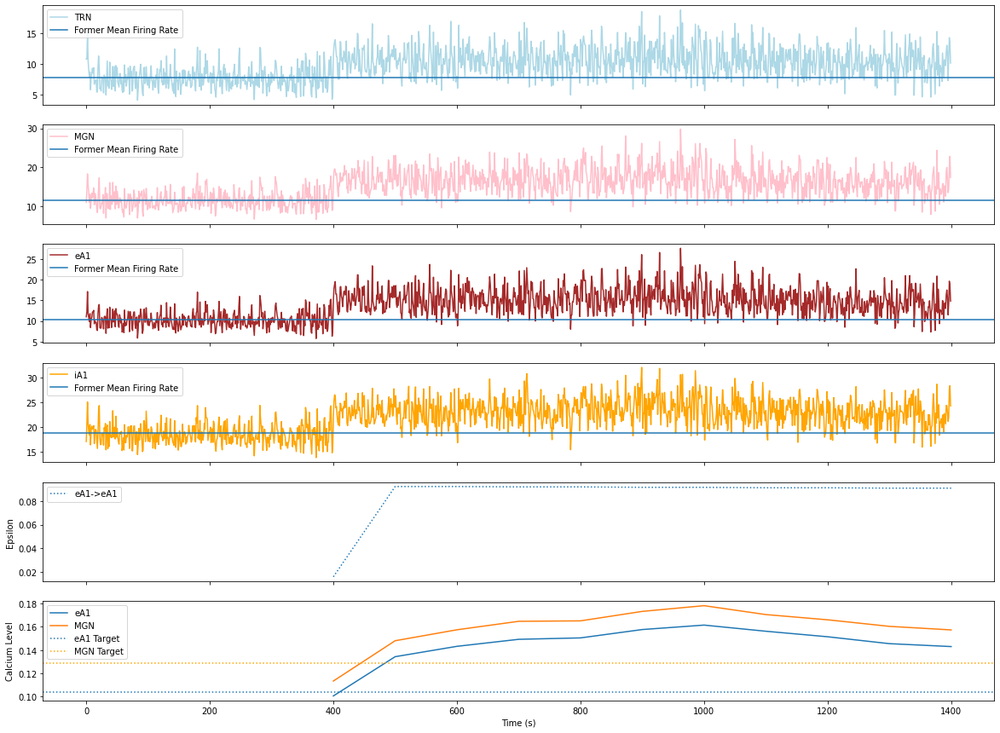

In [95]:
exp_name = 'mgn-to-eaone-50pc-highgr-lowupdt'
pth = "../../demyelination/data/"+exp_name+"/activity/"
fl = "spk_"+exp_name+"_T=0_disabled_conn_ratio=0.5_"

nthread = 1

ex_eA1 = gatherNestConnectivity(pth, \
             fl, \
             nthread, "MGN", "eA1")


# DendriteType_Population
perc_mgn_eA1 = np.divide(ex_eA1, 2000*200)

## Data Gathering End
## Plotting Start

fig, ax = plt.subplots(nrows=6, ncols=1, sharex=True)
fig.set_size_inches(20, 15)

tstart = 0 * 1000
tstop = 140 * 1000
    
resolution = 100

x = gatherSpikes(pth, fl, nthread, "TRN", 201, 400).time_slice(tstart, tstop).firing_rate(resolution, average=True)
ax[0].plot(x, label='TRN', c='lightblue')
ax[0].axhline(7.8, label="Former Mean Firing Rate")

# x, y = pipeline.smoothedspikes(p.spikeobj['MGN'].id_slice(np.arange(41, 201)).time_slice(tstart, tstop))
x = gatherSpikes(pth, fl, nthread, "MGN", 1, 200).time_slice(tstart, tstop).firing_rate(resolution, average=True)
ax[1].plot(x, label='MGN', c='pink')
ax[1].axhline(11.5, label="Former Mean Firing Rate")

# x, y = pipeline.smoothedspikes(p.spikeobj['eA1'].id_slice(np.arange(801, 2400)).time_slice(tstart, tstop))
x = gatherSpikes(pth, fl, nthread, "eA1", 401, 2400).time_slice(tstart, tstop).firing_rate(resolution, average=True)
ax[2].plot(x, label='eA1', c='brown')
ax[2].axhline(10.4, label="Former Mean Firing Rate")

# x, y = pipeline.smoothedspikes(p.spikeobj['iA1'].time_slice(tstart, tstop))
x = gatherSpikes(pth, fl, nthread, "iA1", 2401, 2900).time_slice(tstart, tstop).firing_rate(resolution, average=True)
ax[3].plot(x, label='iA1', c='orange')
ax[3].axhline(18.9, label="Former Mean Firing Rate")

x_range = np.arange(400, 1401, 100)

ax[4].plot(x_range, perc_mgn_eA1, ":", label="eA1->eA1")
ax[4].set_ylabel("Epsilon")

ax[5].plot(x_range, gatherCalcium(pth, fl, nthread)['eA1'], label="eA1")
ax[5].plot(x_range, gatherCalcium(pth, fl, nthread)['MGN'], label="MGN")
ax[5].axhline(.104, ls=":", label="eA1 Target")
ax[5].axhline(.129, ls=":", label="MGN Target", color="orange")
ax[5].set_ylabel("Calcium Level")

# ax[6].plot(x_range, connectivity['z']['Axon']['in']['iA1'], label="eA1")

plt.xlabel("Time (s)")
# plt.ylabel("Mean Spiking Rate")

# plt.xticks(range(0, 20, 1), range(0, 1000, 50))

[ax[_].legend() for _ in range(6)];

# plt.xlim(0, 10)
# ax[4].set_ylim(0.014, .016)

# plt.savefig("/home/pbr-student/Downloads/thesis-plots/destexhe-sp-overshoot-calcium-slowrate-highupdate.pdf")

## 10pcdemy-3000s-100recint_disabled_conn_ratio=0.1_gr_scale=1e-05_update_interval=50

In [165]:
spkobj.time_slice(0, 100).mean_rate()

10.8

** mnist.loader ** package is not installed. To have functions using mnist.loader please install the package.
** tables ** package is not installed. To have functions using tables please install the package.


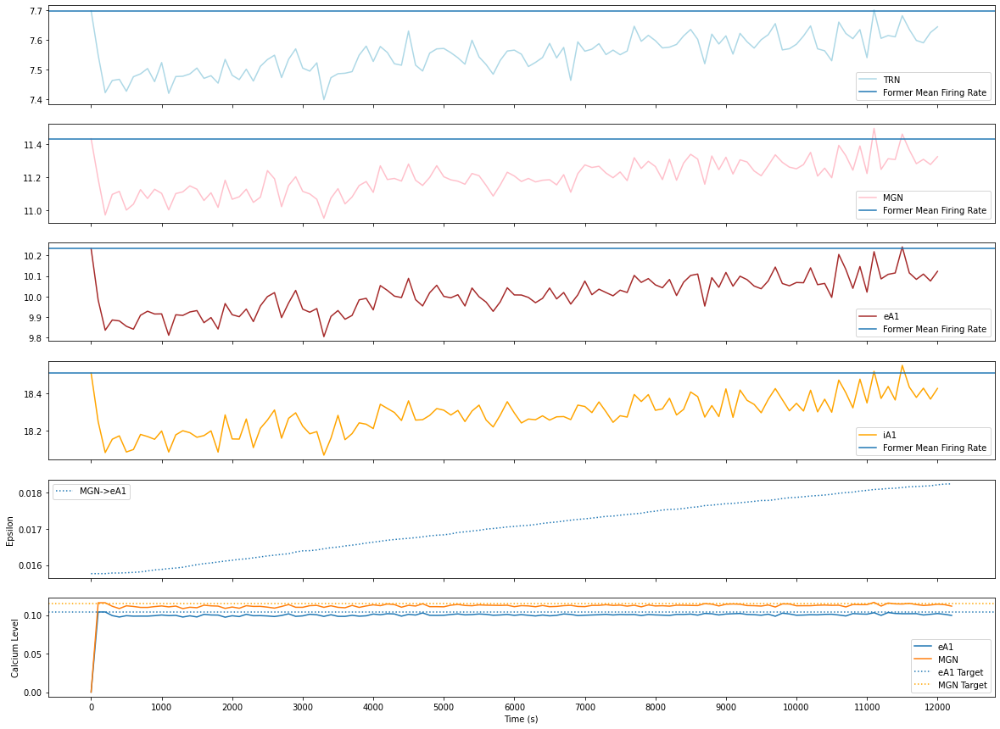

In [8]:
exp_name = '20pcdemy-12000s-100recint'
pth = "../../demyelination/data/"+exp_name+"/activity/"
fl = "spk_"+exp_name+"_disabled_conn_ratio=0.2_gr_scale=1e-05_update_interval=50_"

nthread = 1

ex_eA1 = gatherNestConnectivity(pth, \
             fl, \
             nthread, "MGN", "eA1")


# DendriteType_Population
perc_mgn_eA1 = np.divide(ex_eA1, 2000*200)

## Data Gathering End
## Plotting Start

fig, ax = plt.subplots(nrows=6, ncols=1, sharex=True)
fig.set_size_inches(20, 15)

tstart = 0 * 1000
tstop = 12100 * 1000
    
resolution = 100 * 1000

spkobj = gatherSpikes(pth, fl, nthread, "TRN", 201, 400)
x = spkobj.time_slice(tstart, tstop).firing_rate(resolution, average=True)
ax[0].plot(x, label='TRN', c='lightblue')
ax[0].axhline(spkobj.time_slice(0, resolution).mean_rate(), label="Former Mean Firing Rate")

# x, y = pipeline.smoothedspikes(p.spikeobj['MGN'].id_slice(np.arange(41, 201)).time_slice(tstart, tstop))
spkobj = gatherSpikes(pth, fl, nthread, "MGN", 1, 200)
x = spkobj.time_slice(tstart, tstop).firing_rate(resolution, average=True)
ax[1].plot(x, label='MGN', c='pink')
ax[1].axhline(spkobj.time_slice(0, resolution).mean_rate(), label="Former Mean Firing Rate")

# x, y = pipeline.smoothedspikes(p.spikeobj['eA1'].id_slice(np.arange(801, 2400)).time_slice(tstart, tstop))
spkobj = gatherSpikes(pth, fl, nthread, "eA1", 401, 2400)
x = spkobj.time_slice(tstart, tstop).firing_rate(resolution, average=True)
ax[2].plot(x, label='eA1', c='brown')
ax[2].axhline(spkobj.time_slice(0, resolution).mean_rate(), label="Former Mean Firing Rate")

# x, y = pipeline.smoothedspikes(p.spikeobj['iA1'].time_slice(tstart, tstop))
spkobj = gatherSpikes(pth, fl, nthread, "iA1", 2401, 2900)
x = spkobj.time_slice(tstart, tstop).firing_rate(resolution, average=True)
ax[3].plot(x, label='iA1', c='orange')
ax[3].axhline(spkobj.time_slice(0, resolution).mean_rate(), label="Former Mean Firing Rate")

x_range = np.arange(0, 123, 1)

ax[4].plot(x_range, perc_mgn_eA1, ":", label="MGN->eA1")
ax[4].set_ylabel("Epsilon")

ax[5].plot(x_range, gatherCalcium(pth, fl, nthread)['eA1'], label="eA1")
ax[5].plot(x_range, gatherCalcium(pth, fl, nthread)['MGN'], label="MGN")
ax[5].axhline(.104, ls=":", label="eA1 Target")
ax[5].axhline(.115, ls=":", label="MGN Target", color="orange")
ax[5].set_ylabel("Calcium Level")

# ax[6].plot(x_range, connectivity['z']['Axon']['in']['iA1'], label="eA1")

plt.xlabel("Time (s)")
# plt.ylabel("Mean Spiking Rate")

plt.xticks(range(0, 121, 10), range(0, 12001, 1000))

[ax[_].legend() for _ in range(6)];

# plt.xlim(0, 10)
# ax[4].set_ylim(0.014, .016)

# plt.savefig("/home/pbr-student/Downloads/thesis-plots/destexhe-sp-overshoot-calcium-slowrate-highupdate.pdf")

# mgn-to-eaone-50pc

20% of the connections from the MGN to the eA1 are myelinated and the connections are left to be grown till the target activity is reached.

ValueError: x and y must have same first dimension, but have shapes (23,) and (21,)

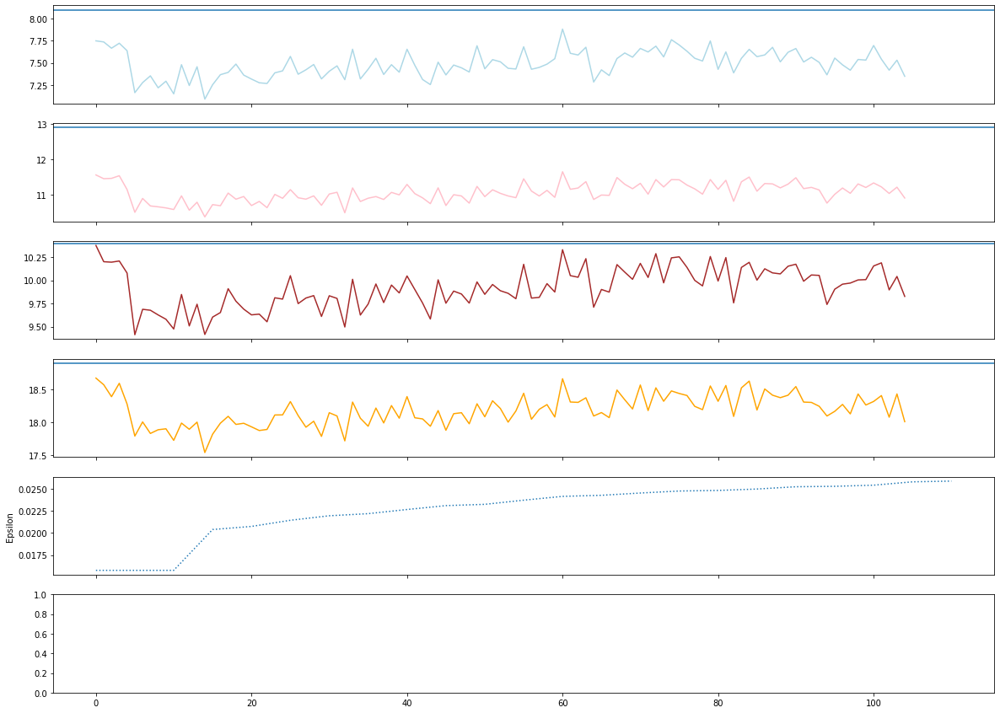

In [881]:
exp_name = 'mgn-to-eaone-50pc'
pth = "../../demyelination/data/"+exp_name+"/activity/"
fl = "spk_"+exp_name+"_T=0_disabled_conn_ratio=0.5_"

nthread = 1

ex_eA1 = gatherNestConnectivity(pth, \
             fl, \
             nthread, "MGN", "eA1")


# DendriteType_Population
perc_mgn_eA1 = np.divide(ex_eA1, 2000*200)

## Data Gathering End
## Plotting Start

fig, ax = plt.subplots(nrows=6, ncols=1, sharex=True)
fig.set_size_inches(20, 15)

tstart = 0 * 1000
tstop = 1050 * 1000
    
resolution = 10 * 1000

x = gatherSpikes(pth, fl, nthread, "TRN", 201, 400).time_slice(tstart, tstop).firing_rate(resolution, average=True)
ax[0].plot(x, label='TRN', c='lightblue')
ax[0].axhline(8.1, label="Former Mean Firing Rate")

# x, y = pipeline.smoothedspikes(p.spikeobj['MGN'].id_slice(np.arange(41, 201)).time_slice(tstart, tstop))
x = gatherSpikes(pth, fl, nthread, "MGN", 1, 200).time_slice(tstart, tstop).firing_rate(resolution, average=True)
ax[1].plot(x, label='MGN', c='pink')
ax[1].axhline(12.9, label="Former Mean Firing Rate")

# x, y = pipeline.smoothedspikes(p.spikeobj['eA1'].id_slice(np.arange(801, 2400)).time_slice(tstart, tstop))
x = gatherSpikes(pth, fl, nthread, "eA1", 401, 2400).time_slice(tstart, tstop).firing_rate(resolution, average=True)
ax[2].plot(x, label='eA1', c='brown')
ax[2].axhline(10.4, label="Former Mean Firing Rate")

# x, y = pipeline.smoothedspikes(p.spikeobj['iA1'].time_slice(tstart, tstop))
x = gatherSpikes(pth, fl, nthread, "iA1", 2401, 2900).time_slice(tstart, tstop).firing_rate(resolution, average=True)
ax[3].plot(x, label='iA1', c='orange')
ax[3].axhline(18.9, label="Former Mean Firing Rate")

x_range = np.arange(0, 111, 5)

ax[4].plot(x_range, perc_mgn_eA1, ":", label="eA1->eA1")
ax[4].set_ylabel("Epsilon")

ca = gatherCalcium(pth, fl, nthread)
ca['eA1'] = ca['eA1'][0] + ca['eA1'][2:]
ca['MGN'] = ca['MGN'][0] + ca['MGN'][2:]

ax[5].plot(x_range, ca['eA1'] , label="eA1")
ax[5].plot(x_range, ca['MGN'], label="MGN")
ax[5].axhline(.104, ls=":", label="eA1 Target")
ax[5].axhline(.129, ls=":", label="MGN Target", color="orange")
ax[5].set_ylabel("Calcium Level")

# ax[6].plot(x_range, connectivity['z']['Axon']['in']['iA1'], label="eA1")

plt.xlabel("Time (s)")
# plt.ylabel("Mean Spiking Rate")

plt.xticks(x_range, range(0, 1111, 50))

[ax[_].legend() for _ in range(6)];

# plt.xlim(0, 10)
# ax[4].set_ylim(0.014, .016)

# plt.savefig("/home/pbr-student/Downloads/thesis-plots/destexhe-sp-overshoot-calcium-slowrate-highupdate.pdf")

In [31]:
exp_name = 'mgn-to-eaone-50pc'
dfs = readnet_timeinterval(exp_name, 100 * 1000, 11900 * 1000, 1)

FileNotFoundError: [Errno 2] No such file or directory: '../../demyelination/data/mgn-to-eaone-50pc/other/1000000.0_net_0'

In [13]:
mgn_eaone_dfs = []
for df in dfs:
    df = df[df.source.between(0, 200) & df.target.between(400, 2400)] # remove all connections which are not MGN->eA1
    mgn_eaone_dfs.append(df)

In [130]:
# for d in mgn_eaone_dfs:
#     print(d.shape[0]/(200*2000))

### a plot of connections between the mgn and eaone

In [140]:
# n_df = len(mgn_eaone_dfs)

# fig, ax = plt.subplots(nrows=n_df, ncols=1)
# fig.set_size_inches(10, 10*n_df)
# record_times = [0] + list( range(0, 9100, 100) )

# for idx, conn_df in enumerate(mgn_eaone_dfs):
#     ax[idx].set_title(str(record_times[idx]))
#     plotConnectionGraph(conn_df, ax[idx])


In [17]:
? ax.set_title

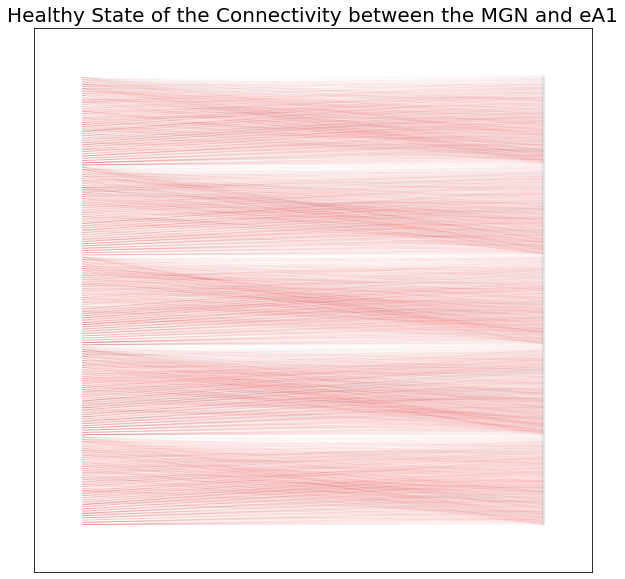

In [26]:
fig, ax = plt.subplots(nrows=1, ncols=1)
fig.set_size_inches(10, 10)

# right_yaxis = ax.twinx()

plotConnectionGraph(mgn_eaone_dfs[1], ax)

ax.set_title("Healthy State of the Connectivity between the MGN and eA1", {"fontsize":20});

# ax.set_ylabel("MGN")
# right_yaxis.set_ylabel("eA1");

right_yaxis.set_visible("False")


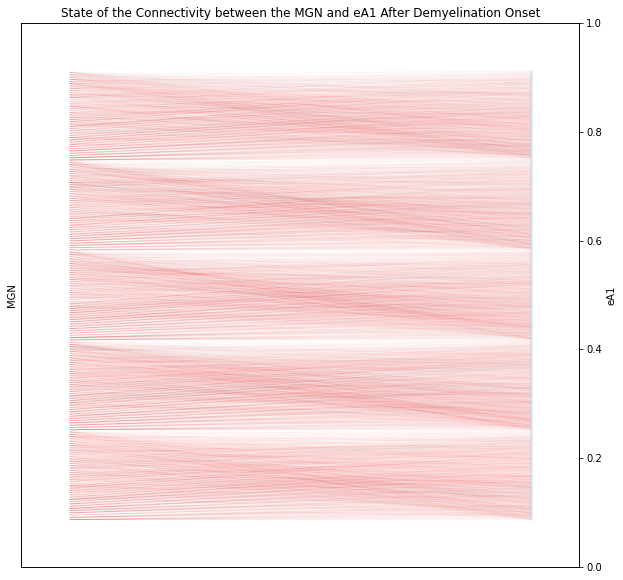

In [34]:
fig, ax = plt.subplots(nrows=1, ncols=1)
fig.set_size_inches(10, 10)

right_yaxis = ax.twinx()

plotConnectionGraph(mgn_eaone_dfs[1], ax)

ax.set_title("State of the Connectivity between the MGN and eA1 After Demyelination Onset");

ax.set_ylabel("MGN")
right_yaxis.set_ylabel("eA1");

right_yaxis.set_visible("False")


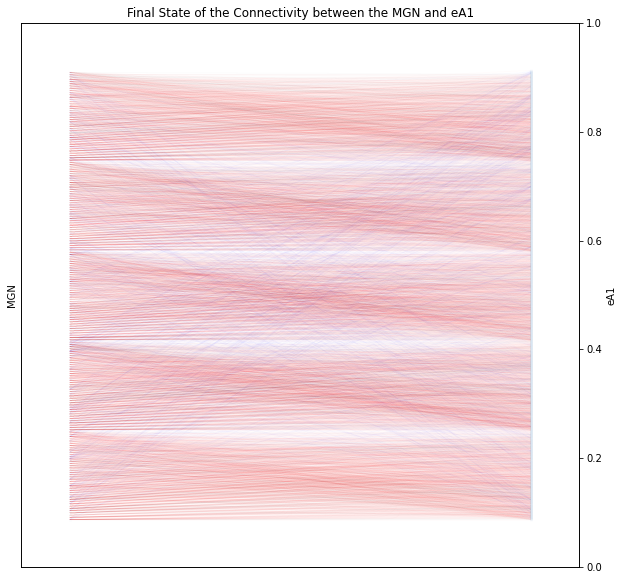

In [41]:
fig, ax = plt.subplots(nrows=1, ncols=1)
fig.set_size_inches(10, 10)

right_yaxis = ax.twinx()

plotConnectionGraph(mgn_eaone_dfs[-1], ax)

ax.set_title("Final State of the Connectivity between the MGN and eA1");

ax.set_ylabel("MGN")
right_yaxis.set_ylabel("eA1");

right_yaxis.set_visible("False")


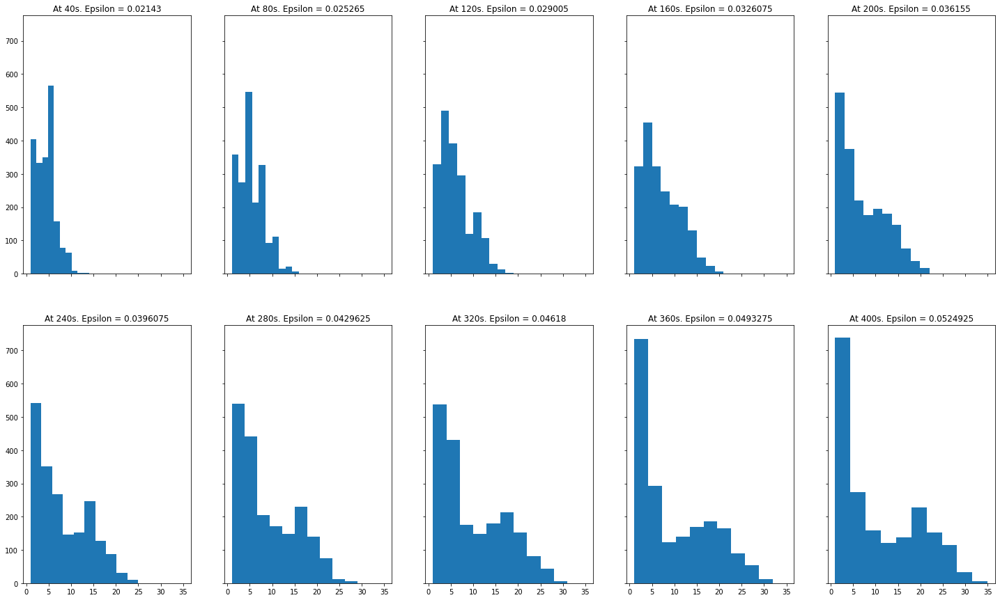

In [153]:
fig, ax = plt.subplots(nrows=2, ncols=5, sharey=True, sharex=True)
fig.set_size_inches(25, 15)
ax = ax.flatten()

indeg_overtime = [_.target.value_counts() for _ in mgn_eaone_dfs]

for idx, start in enumerate( range(40, 401, 40) ):
    ax[idx].hist(indeg_overtime[idx], density=False)
    
    ax[idx].title.set_text("At {stop}s. Epsilon = {eps}".format(stop=start, eps= mgn_eaone_dfs[idx].shape[0]/(2000*200) ) )

# ax[-1].hist(indeg_fr_hardwired.firing_rate, alpha=.3, density=True)
# ax[0].hist(indeg_fr_hardwired.firing_rate, alpha=.3, density=True)

# fig.suptitle("Histogram of Mean Firing Rate as Connection Growth Progresses from 0 to 300s");



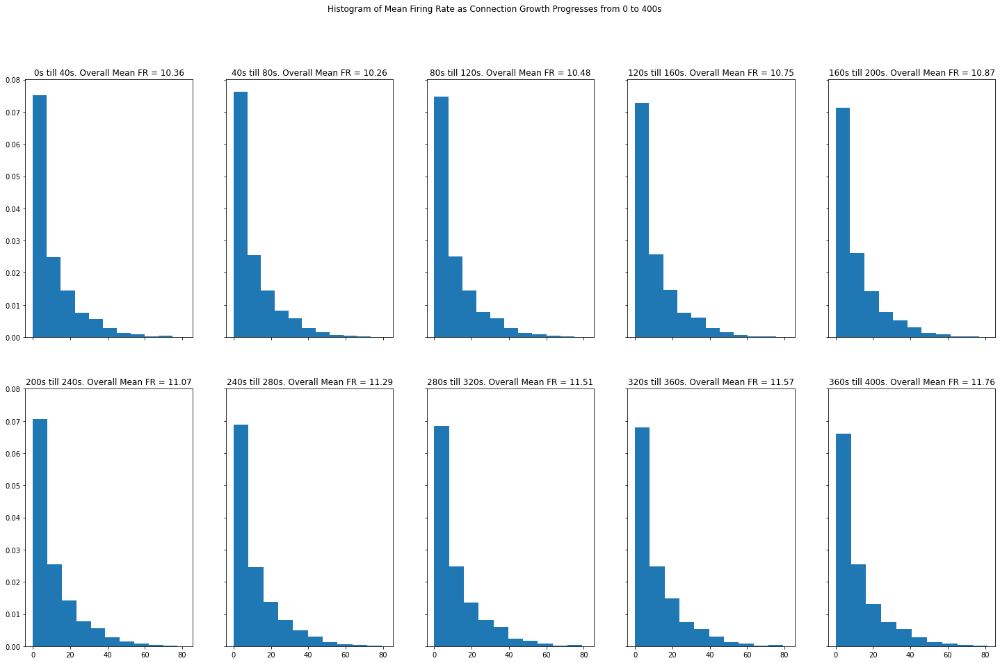

In [156]:

s = gatherSpikes(pth, fl, 1, "eA1", 401, 2400)

fig, ax = plt.subplots(nrows=2, ncols=5, sharey=True, sharex=True)
fig.set_size_inches(25, 15)
ax = ax.flatten()

for idx, start in enumerate( range(0, 400, 40) ):
    mfr = s.time_slice(start * 1000, (start+40) * 1000).mean_rates()
    
    ax[idx].hist(mfr, density=True)
    
    ax[idx].title.set_text("{start}s till {stop}s. Overall Mean FR = {mean_mfr}".format(start=start, stop=start+40, mean_mfr=round( np.mean(mfr), 2 )) )

# ax[-1].hist(indeg_fr_hardwired.firing_rate, alpha=.3, density=True)
# ax[0].hist(indeg_fr_hardwired.firing_rate, alpha=.3, density=True)

fig.suptitle("Histogram of Mean Firing Rate as Connection Growth Progresses from 0 to 400s");


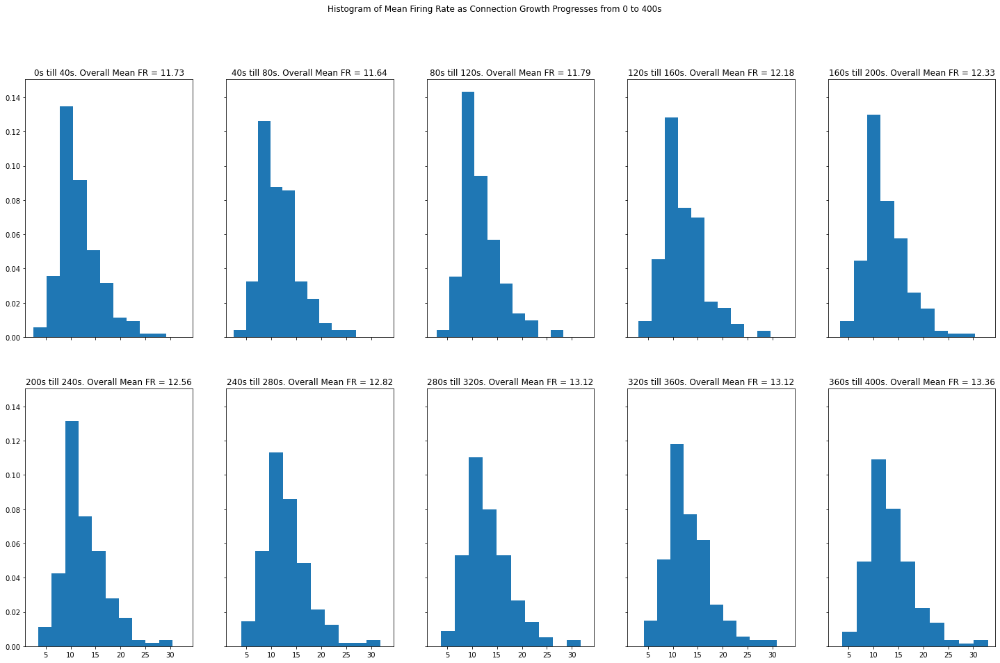

In [157]:

# s = gatherSpikes(pth, fl, 1, "eA1", 401, 2400)
s = gatherSpikes(pth, fl, 1, "MGN", 1, 200)

fig, ax = plt.subplots(nrows=2, ncols=5, sharey=True, sharex=True)
fig.set_size_inches(25, 15)
ax = ax.flatten()

for idx, start in enumerate( range(0, 400, 40) ):
    mfr = s.time_slice(start * 1000, (start+40) * 1000).mean_rates()
    
    ax[idx].hist(mfr, density=True)
    
    ax[idx].title.set_text("{start}s till {stop}s. Overall Mean FR = {mean_mfr}".format(start=start, stop=start+40, mean_mfr=round( np.mean(mfr), 2 )) )

# ax[-1].hist(indeg_fr_hardwired.firing_rate, alpha=.3, density=True)
# ax[0].hist(indeg_fr_hardwired.firing_rate, alpha=.3, density=True)

fig.suptitle("Histogram of Mean Firing Rate as Connection Growth Progresses from 0 to 400s");


## no demyleination applied

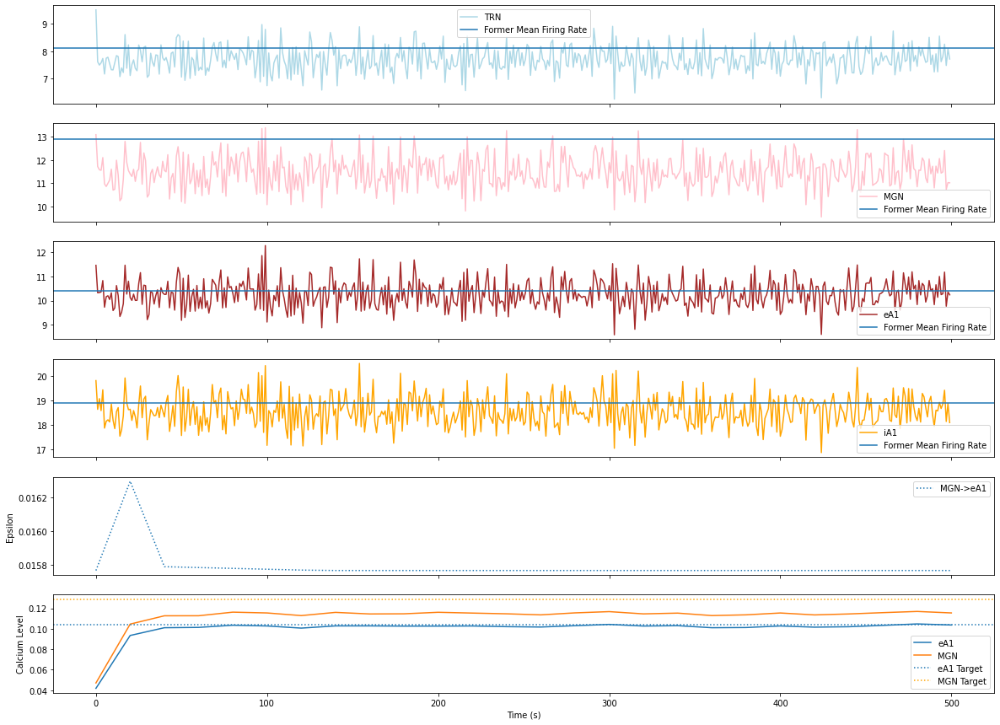

In [737]:
exp_name = 'mgn-to-eaone-0pc'
pth = "../../demyelination/data/"+exp_name+"/activity/"
fl = "spk_"+exp_name+"_T=0_disabled_conn_ratio=0.0_"

nthread = 1

ex_eA1 = gatherNestConnectivity(pth, \
             fl, \
             nthread, "MGN", "eA1")


# DendriteType_Population
perc_mgn_eA1 = np.divide(ex_eA1, 2000*200)

## Data Gathering End
## Plotting Start

fig, ax = plt.subplots(nrows=6, ncols=1, sharex=True)
fig.set_size_inches(20, 15)

tstart = 0 * 1000
tstop = 500 * 1000
    
resolution = 1000

x = gatherSpikes(pth, fl, nthread, "TRN", 201, 400).time_slice(tstart, tstop).firing_rate(resolution, average=True)
ax[0].plot(x, label='TRN', c='lightblue')
ax[0].axhline(8.1, label="Former Mean Firing Rate")

# x, y = pipeline.smoothedspikes(p.spikeobj['MGN'].id_slice(np.arange(41, 201)).time_slice(tstart, tstop))
x = gatherSpikes(pth, fl, nthread, "MGN", 1, 200).time_slice(tstart, tstop).firing_rate(resolution, average=True)
ax[1].plot(x, label='MGN', c='pink')
ax[1].axhline(12.9, label="Former Mean Firing Rate")

# x, y = pipeline.smoothedspikes(p.spikeobj['eA1'].id_slice(np.arange(801, 2400)).time_slice(tstart, tstop))
x = gatherSpikes(pth, fl, nthread, "eA1", 401, 2400).time_slice(tstart, tstop).firing_rate(resolution, average=True)
ax[2].plot(x, label='eA1', c='brown')
ax[2].axhline(10.4, label="Former Mean Firing Rate")

# x, y = pipeline.smoothedspikes(p.spikeobj['iA1'].time_slice(tstart, tstop))
x = gatherSpikes(pth, fl, nthread, "iA1", 2401, 2900).time_slice(tstart, tstop).firing_rate(resolution, average=True)
ax[3].plot(x, label='iA1', c='orange')
ax[3].axhline(18.9, label="Former Mean Firing Rate")

x_range = np.arange(0, 501, 20)

ax[4].plot(x_range, perc_mgn_eA1, ":", label="MGN->eA1")
ax[4].set_ylabel("Epsilon")

ax[5].plot(x_range, gatherCalcium(pth, fl, nthread)['eA1'], label="eA1")
ax[5].plot(x_range, gatherCalcium(pth, fl, nthread)['MGN'], label="MGN")
ax[5].axhline(.104, ls=":", label="eA1 Target")
ax[5].axhline(.129, ls=":", label="MGN Target", color="orange")
ax[5].set_ylabel("Calcium Level")

# ax[6].plot(x_range, connectivity['z']['Axon']['in']['iA1'], label="eA1")

plt.xlabel("Time (s)")
# plt.ylabel("Mean Spiking Rate")

# plt.xticks(range(0, 20, 1), range(0, 1000, 50))

[ax[_].legend() for _ in range(6)];

# plt.xlim(0, 10)
# ax[4].set_ylim(0.014, .016)

# plt.savefig("/home/pbr-student/Downloads/thesis-plots/no-demyelination-sp-enabled.pdf")

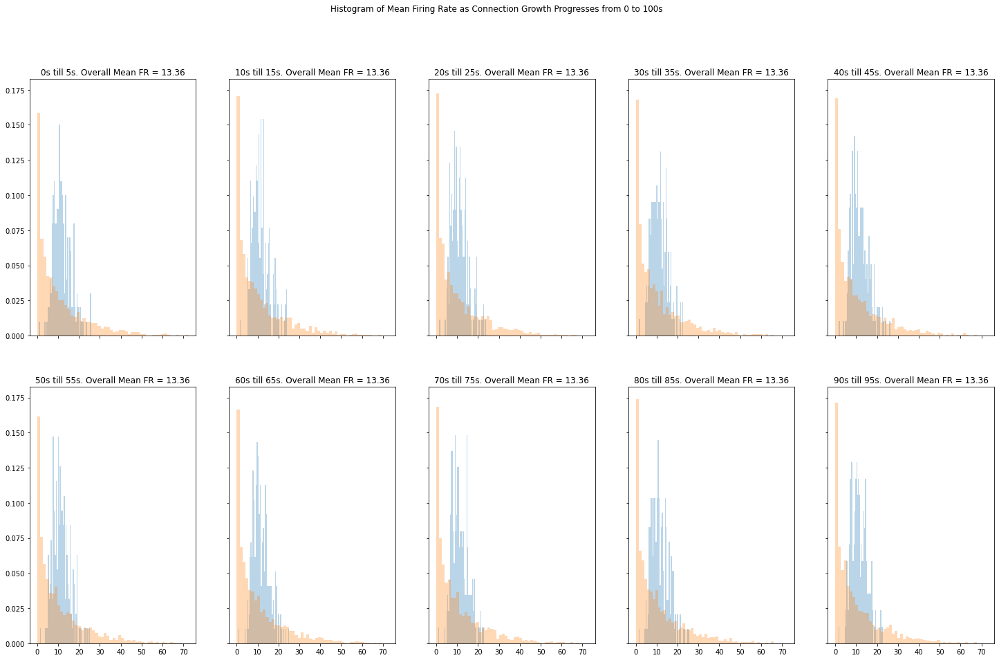

In [248]:

s_eaone = gatherSpikes(pth, fl, 1, "eA1", 401, 2400)
s_mgn = gatherSpikes(pth, fl, 1, "MGN", 1, 200)

fig, ax = plt.subplots(nrows=2, ncols=5, sharey=True, sharex=True)
fig.set_size_inches(25, 15)
ax = ax.flatten()

step = 10
for idx, start in enumerate( range(0, 91, step) ):
    mfr_mgn = s_mgn.time_slice(start * 1000, (start+step) * 1000).mean_rates()
    mfr_eaone = s_eaone.time_slice(start * 1000, (start+step) * 1000).mean_rates()
    
    ax[idx].hist(mfr_mgn, bins=50, density=True, alpha=.3)
    ax[idx].hist(mfr_eaone, bins=50, density=True, alpha=.3)
    
    ax[idx].title.set_text("{start}s till {stop}s. Overall Mean FR = {mean_mfr}".format(start=start, stop=start+5, mean_mfr=round( np.mean(mfr), 2 )) )

# ax[-1].hist(indeg_fr_hardwired.firing_rate, alpha=.3, density=True)
# ax[0].hist(indeg_fr_hardwired.firing_rate, alpha=.3, density=True)

fig.suptitle("Histogram of Mean Firing Rate as Connection Growth Progresses from 0 to 100s");


## mgn-to-eaone-20pc

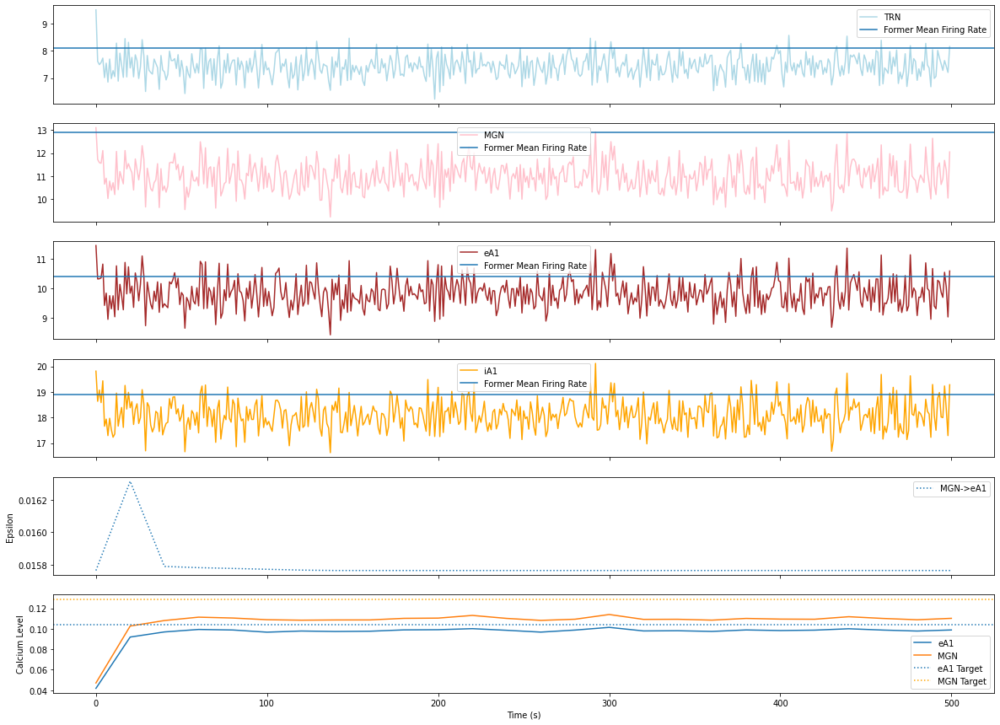

In [748]:
exp_name = 'mgn-to-eaone-20pc'
pth = "../../demyelination/data/"+exp_name+"/activity/"
fl = "spk_"+exp_name+"_T=0_disabled_conn_ratio=0.2_"

nthread = 1

ex_eA1 = gatherNestConnectivity(pth, \
             fl, \
             nthread, "MGN", "eA1")


# DendriteType_Population
perc_mgn_eA1 = np.divide(ex_eA1, 2000*200)

## Data Gathering End
## Plotting Start

fig, ax = plt.subplots(nrows=6, ncols=1, sharex=True)
fig.set_size_inches(20, 15)

tstart = 0 * 1000
tstop = 500 * 1000
    
resolution = 1000

x = gatherSpikes(pth, fl, nthread, "TRN", 201, 400).time_slice(tstart, tstop).firing_rate(resolution, average=True)
ax[0].plot(x, label='TRN', c='lightblue')
ax[0].axhline(8.1, label="Former Mean Firing Rate")

# x, y = pipeline.smoothedspikes(p.spikeobj['MGN'].id_slice(np.arange(41, 201)).time_slice(tstart, tstop))
x = gatherSpikes(pth, fl, nthread, "MGN", 1, 200).time_slice(tstart, tstop).firing_rate(resolution, average=True)
ax[1].plot(x, label='MGN', c='pink')
ax[1].axhline(12.9, label="Former Mean Firing Rate")

# x, y = pipeline.smoothedspikes(p.spikeobj['eA1'].id_slice(np.arange(801, 2400)).time_slice(tstart, tstop))
x = gatherSpikes(pth, fl, nthread, "eA1", 401, 2400).time_slice(tstart, tstop).firing_rate(resolution, average=True)
ax[2].plot(x, label='eA1', c='brown')
ax[2].axhline(10.4, label="Former Mean Firing Rate")

# x, y = pipeline.smoothedspikes(p.spikeobj['iA1'].time_slice(tstart, tstop))
x = gatherSpikes(pth, fl, nthread, "iA1", 2401, 2900).time_slice(tstart, tstop).firing_rate(resolution, average=True)
ax[3].plot(x, label='iA1', c='orange')
ax[3].axhline(18.9, label="Former Mean Firing Rate")

x_range = np.arange(0, 501, 20)

ax[4].plot(x_range, perc_mgn_eA1, ":", label="MGN->eA1")
ax[4].set_ylabel("Epsilon")

ax[5].plot(x_range, gatherCalcium(pth, fl, nthread)['eA1'], label="eA1")
ax[5].plot(x_range, gatherCalcium(pth, fl, nthread)['MGN'], label="MGN")
ax[5].axhline(.104, ls=":", label="eA1 Target")
ax[5].axhline(.129, ls=":", label="MGN Target", color="orange")
ax[5].set_ylabel("Calcium Level")

# ax[6].plot(x_range, connectivity['z']['Axon']['in']['iA1'], label="eA1")

plt.xlabel("Time (s)")
# plt.ylabel("Mean Spiking Rate")

# plt.xticks(range(0, 20, 1), range(0, 1000, 50))

[ax[_].legend() for _ in range(6)];

# plt.xlim(0, 10)
# ax[4].set_ylim(0.014, .016)

# plt.savefig("/home/pbr-student/Downloads/thesis-plots/no-demyelination-sp-enabled.pdf")